In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from pycocotools.coco import COCO
import numpy as np
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)
from scipy.misc import imread
import matplotlib.patches as patches
from torch.utils.data import DataLoader
import cv2
import torch
from torch.autograd import  Variable
from faster_rcnn.utils.images import imshow
from faster_rcnn.fastrcnn.bbox_transform import bbox_transform


### Đọc dữ liệu từ MS COCO dataset


In [3]:
import os
import torchvision.transforms as transforms
from faster_rcnn.utils.datasets.mscoco.dataset import CocoData
from faster_rcnn.utils.datasets.data_generator import CocoGenerator
from faster_rcnn.utils.datasets.data_generator import Enqueuer

dataDir = './data/mscoco'
dataType = 'train2014'
annFile='%s/annotations/instances_%s.json'%(dataDir,dataType)
pre_proposal_folder = './data/mscoco/coco_proposals/MCG/'

images_dir = os.path.join(dataDir,'images', dataType)
cap = CocoData(root = images_dir, annFile = annFile)

data_gen = CocoGenerator(data=cap)
queue = Enqueuer(generator=data_gen)
queue.start(max_queue_size=10, workers=2)
t = queue.get()


loading annotations into memory...
Done (t=13.56s)
creating index...
index created!


## RPN

#### Mục đích 

- Do Fast RCNN vẫn phụ thuộc vào Selective search để tính toán các proposal region dẫn đến kết quả tính toán rất chậm
- RPN dùng để tính toán proposal region mà không cần phụ thuộc vào các thuật toán khác

#### Cách hoạt động

- Sử dụng một cửa sổ trượt trên feature map
- tạo một network nhỏ để tính
    - Phân loạt một anchor có chứa hay không chưa object (Anchor good / bad)
    - Tính toán các trị số của proposal regions (box regression)
    
- Vị trí của cửa sổ trượt trên feature map, cho biết thông tin về vị trí của anchor trên ảnh gốc

#### Input

- Hình ảnh: là tensor có kích thước

    $[batchsize, dim, im\_height, im\_width]$
    
- bounding box:
    
    $(x_1, y_1, x_2, y_2)$

    - $x_1, y_1$ : tọa độ x,y của điểm trái dưới (lower-left)
    - $x_2, y_2$ : tọa độ x,y của điểm phải trên (top - right)

#### Output

- RPN classification (anchor good / bad)
- RPN regression (anchor -> proposal)

Cùng xem định dạng của một input

In [4]:
data = cap[13499]
im = data['tensor']
gt_boxes =  data['boxes']
image_data = im[0]

print(im.shape)
print(gt_boxes)

torch.Size([1, 3, 600, 800])
[[140.   253.75 185.   430.  ]
 [318.75 247.5  442.5  388.75]
 [397.5  242.5  571.25 395.  ]]


Thử hiển thị ảnh cùng các bounding boxes

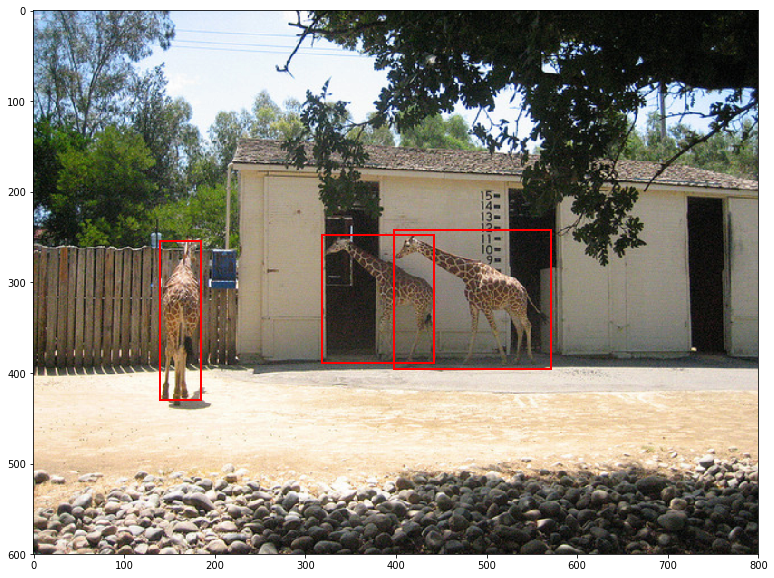

In [5]:
imshow(image_data, gt_boxes)

In [6]:
from faster_rcnn.faster_rcnn import  RPN
rpn_network = RPN()

/data
/data/data/mscoco


faster_rcnn/network.py:26: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  nn.init.xavier_normal(self.conv.weight)


### Tính toán feed-forward


Chúng ta sử dụng một ảnh có kích thước đầu vào là  `(width , height) = (600, 800)`

Input:
    - im_data : 
        kích thước : (batch_size, dim, witdh, height)
    - ground_boxes: 
        kích thước (n, 4)
        

In [7]:
im.shape

torch.Size([1, 3, 600, 800])

#### Tính `cnn features`  

Sử dụng mạng CNN đã được train trên Imagenet, cụ thể là VGG16 để tính toán `cnn features`

In [8]:
# convert tensor to variable
x = Variable(im)
cnn_feature = rpn_network.features(x)

Chúng ta nhận được cnn_features có kích thước là  (37 , 50)

In [9]:
cnn_feature.shape

torch.Size([1, 512, 37, 50])

In [10]:
feature_height, feature_width = cnn_feature.shape[2], cnn_feature.shape[3]
im_height, im_width = im.shape[2] , im.shape[3]
batch_size = im.shape[0]

### Nhận xét

Sau khi feed-forward một lần đối với ảnh gốc, thu được convolutional features của ảnh đó. Ví dụ với một hình ảnh có kích thước $600 * 800 * 3$, ta sẽ thu được convolutional features với kích thước $37 * 50 * 512$. Kích thước của features bị giảm nhỏ khoảng 16 lần $\frac{600}{37}$.

## AnchorTargerLayer

Sau khi thu được Convolutional Feature, chúng ta sẽ cùng tìm hiểu về AnchorTargetLayer.

### Vai trò của AnchorTargetlayer
    Gán cho anchor tương ứng với ground-truth boxes. 
    Tạo ra nhãn tương ứng cho từng anchor (bằng cách tính toán IOU)
    Tính giá trị mục tiêu của bounding-box regression

Tính toán đầu ra của RPN

- rpn_labels : (HxWxA, 1), for each anchor, 0 denotes bg, 1 fg, -1 dontcare
- rpn_bbox_targets: (HxWxA, 4), distances of the anchors to the gt_boxes(may contains some transform) that are the regression objectives
- rpn_bbox_inside_weights: (HxWxA, 4) weights of each boxes, mainly accepts hyper param in cfg
- rpn_bbox_outside_weights: (HxWxA, 4) used to balance the fg/bg, beacuse the numbers of bgs and fgs mays significiantly different

In [11]:
from faster_rcnn.rpn_msr.anchor_target_layer_2 import AnchorTargerLayer
anchor_target_layer = AnchorTargerLayer(feat_stride=[16,], anchor_scales=[8, 16 ,32])

#### Tạo các anchor tương ứng với vị trí ảnh tại vị trí [0. , 0. , 0., 0.]

In [12]:
anchor_target_layer._anchors

array([[ -84.,  -40.,   99.,   55.],
       [-176.,  -88.,  191.,  103.],
       [-360., -184.,  375.,  199.],
       [ -56.,  -56.,   71.,   71.],
       [-120., -120.,  135.,  135.],
       [-248., -248.,  263.,  263.],
       [ -36.,  -80.,   51.,   95.],
       [ -80., -168.,   95.,  183.],
       [-168., -344.,  183.,  359.]])

![title](https://deepmlml.com/images/rpn/rpn.png)

Để tạo ra region proposals, chúng ta sử dụng một network hay còn gọi là cửa sổ trượt (sliding-window) kích thước $n \times n$ trượt trên convolutional features. Đầu ra của network này là đầu vào của 2 fully-connected layer dự đoán vị trí của regions (box-regression layer), cũng như xác suất chứa object(box-classification) của hộp ấy. Tại mỗi vị trí của cửa sổ trượt chúng ta dự đoán đồng thời nhiều nhiều region proposal cùng một lúc, với $k$ là số proposal tương ứng với mỗi vị trí. Vậy $reg$ layer có $4k$ đầu ra dự đoán vị trí của $k$ proposal,  $cls$ layer chứa $2k$ đầu ra dự đoán xác suất chứa vật thể của proposal.

Các anchor được tạo ở trên tương ứng với vị trí $[0. , 0., ]$ trên ảnh gốc, ta có thể xem trên hình vẽ minh họa dưới đây

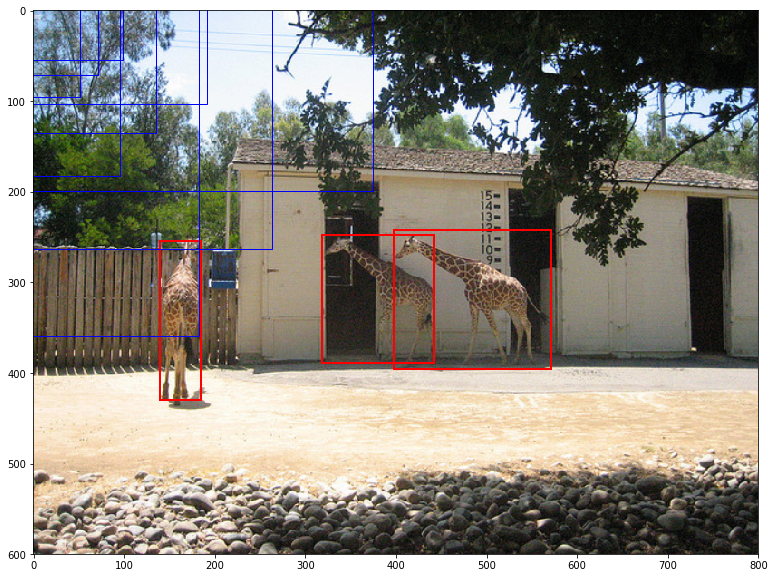

In [13]:
imshow(image_data, gt_boxes, anchor_target_layer._anchors)

Đối với vị trí $[100. , 300. ]$ trên ảnh gốc, ta có các anchors tương ứng như sau

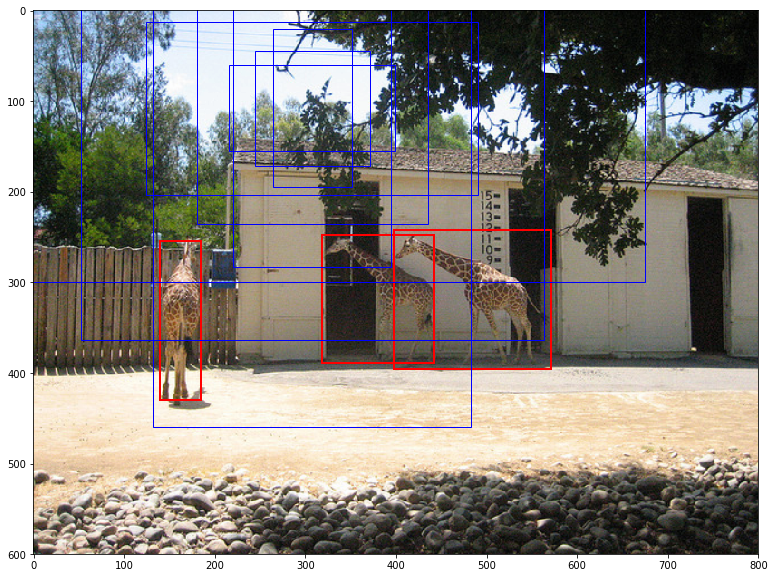

In [14]:
imshow(image_data, gt_boxes, anchor_target_layer._anchors  + [300., 100. , 300., 100. ])

Tính anchors trên toàn bộ ảnh tương ứng với đoạn code dưới đây
```python
def _create_anchors(self, feature_height, feature_width):
    shift_x = np.arange(0, feature_width) * self._feat_stride
    shift_y = np.arange(0, feature_height) * self._feat_stride

    shift_x, shift_y = np.meshgrid(shift_x, shift_y)
    shifts = np.vstack((shift_x.ravel(), shift_y.ravel(),
                        shift_x.ravel(), shift_y.ravel())).transpose()
    # generate shifted anchors
    A = self._num_anchors
    K = shifts.shape[0]

    all_anchors = (self._anchors.reshape((1, A, 4)) +
                   shifts.reshape((1, K, 4)).transpose((1, 0, 2)))
    all_anchors = all_anchors.reshape((K * A, 4))
return all_anchors
```

##### Khi plot toàn bộ anchor được sinh ra ta thu được lưới các anchor.

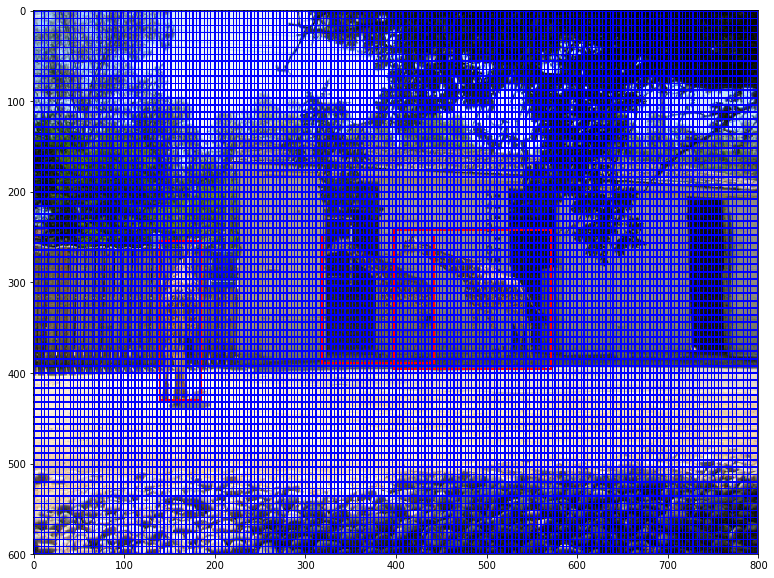

In [15]:
all_anchors = anchor_target_layer._create_anchors(feature_height, feature_width)
imshow(image_data, gt_boxes, all_anchors)

## Khái niệm IOU (Intersec Over Union)

Để tính toán tỉ lệ chồng chập của 2 hình ta sử dụng khái niệm IOU. Như tên của khái niệm, đây là tỉ lệ diện tích phần giao của 2 hình trên tổng diện tích phần chập của 2 hình 

Xét 2 hình chữ nhật có tọa độ lần lượt là 

- $[318.75, 247.5,  442.5,  388.75]$
- $[397.5,  242.5,  571.25, 395.  ]$ 

Để tính toán IOU giữa 2 bounding box. chúng ta sử dụng hàm sau 
```python
    
def bbox_overlaps(np.ndarray[DTYPE_t, ndim=2] boxes,
        np.ndarray[DTYPE_t, ndim=2] query_boxes):
    return bbox_overlaps_c(boxes, query_boxes)

cdef np.ndarray[DTYPE_t, ndim=2] bbox_overlaps_c(
        np.ndarray[DTYPE_t, ndim=2] boxes,
        np.ndarray[DTYPE_t, ndim=2] query_boxes):
    """
    Parameters
    ----------
    boxes: (N, 4) ndarray of float
    query_boxes: (K, 4) ndarray of float
    Returns
    -------
    overlaps: (N, K) ndarray of overlap between boxes and query_boxes
    """
    cdef unsigned int N = boxes.shape[0]
    cdef unsigned int K = query_boxes.shape[0]
    cdef np.ndarray[DTYPE_t, ndim=2] overlaps = np.zeros((N, K), dtype=DTYPE)
    cdef DTYPE_t iw, ih, box_area
    cdef DTYPE_t ua
    cdef unsigned int k, n
    for k in range(K):
        box_area = (
            (query_boxes[k, 2] - query_boxes[k, 0] + 1) *
            (query_boxes[k, 3] - query_boxes[k, 1] + 1)
        )
        for n in range(N):
            iw = (
                min(boxes[n, 2], query_boxes[k, 2]) -
                max(boxes[n, 0], query_boxes[k, 0]) + 1
            )
            if iw > 0:
                ih = (
                    min(boxes[n, 3], query_boxes[k, 3]) -
                    max(boxes[n, 1], query_boxes[k, 1]) + 1
                )
                if ih > 0:
                    ua = float(
                        (boxes[n, 2] - boxes[n, 0] + 1) *
                        (boxes[n, 3] - boxes[n, 1] + 1) +
                        box_area - iw * ih
                    )
                    overlaps[n, k] = iw * ih / ua
    return overlaps

```

('IOU:', array([[0.17207822]]))


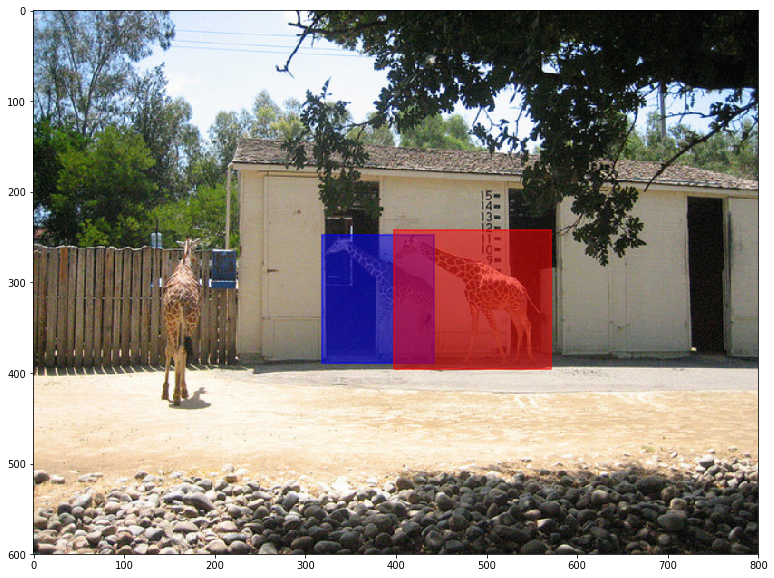

In [16]:
from faster_rcnn.utils.cython_bbox import bbox_overlaps
inp = image_data
inp = inp.numpy().transpose((1, 2, 0))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
inp = std * inp + mean
inp = np.clip(inp, 0, 1)
fig,ax = plt.subplots(1, figsize=(20, 10))
boxes = [[318.75, 247.5,  442.5,  388.75],[397.5,  242.5,  571.25, 395.  ]]
box_1 = boxes[0]
box_2 = boxes[1]
rect_1 = patches.Rectangle((box_1[0], box_1[1]), box_1[2] - box_1[0], box_1[3] - box_1[1]  ,linewidth=2, color = 'blue', alpha = 0.5)
rect_2 = patches.Rectangle((box_2[0], box_2[1]), box_2[2] - box_2[0], box_2[3] - box_2[1]  ,linewidth=2, color = 'red', alpha = 0.5)
ax.add_patch(rect_1)
ax.add_patch(rect_2)
ax.imshow(inp)
print("IOU:",  bbox_overlaps(np.array([[318.75, 247.5,  442.5,  388.75]]),np.array([[397.5,  242.5,  571.25, 395.  ]])))

#### Gán nhãn cho anchors dựa trên IOU đối với bounding boxes

Các anchors này sẽ được gán mác là positive hoặc negative dựa vào diện tích overlap với ground truth box theo luật như sau.

- Các anchor được phân loại là positive nếu
	+ Là anchor có  IOU với một ground truth box.
	+ Là anchor có  tỉ lệ IoU với một ground truth lớn hơn 0.7

- Các anchor được phân noại là negative nếu có giá trị IoU bé hơn 0.3
- Các anchor không thỏa mãn 2 điều kiện nêu trên thì bỏ qua. Không được đánh giá trong quá trình training object.

In [17]:
# Lọc các anchor nằm ngoài ảnh
inside_anchors, inside_anchors_indexes = anchor_target_layer._filter_outside_anchors(all_anchors=all_anchors, im_height=im_height, im_width=im_width)

Có tất cả 5944 anchors nằm trong ảnh


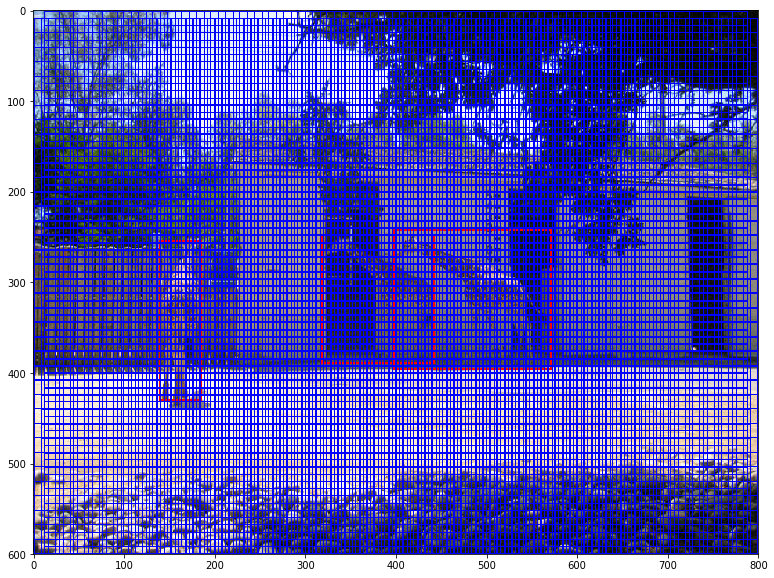

In [18]:
print("Có tất cả %d anchors nằm trong ảnh" % inside_anchors.shape[0])
imshow(image_data, gt_boxes, inside_anchors)

In [19]:
# khởi tạo nhãn cùng bbox_targets 
labels = np.empty(
    (batch_size, inside_anchors.shape[0]), dtype=np.float32)
bbox_targets = np.zeros(
    (batch_size, inside_anchors.shape[0], 4), dtype=np.float32)
labels.fill(-1)

print labels.shape
print bbox_targets.shape

(1, 5944)
(1, 5944, 4)


In [20]:
overlaps = bbox_overlaps(inside_anchors.astype(
            np.float), gt_boxes.astype(np.float))

Thu được ma trận $overlaps$ kích thước $m * n$ trong đó
    $overlaps_{mn}$ là giá trị overlap của anchor thứ $m$ với ground truth boxes thứ $n$
    
Cụ thể ở đây ta có 5944 anchor nằm trong hình, cùng 3 ground truth boxes
    

In [21]:
overlaps.shape

(5944, 3)

In [41]:
argmax_overlaps = overlaps.argmax(axis=1)
print("ground truth box có overlap lớn nhất đối với từng anchors: argmax_overlaps")
print(argmax_overlaps.shape)
print(argmax_overlaps)


print("anchors có overlap lớn nhất đối với từng ground truth box  : gt_argmax_overlaps")
gt_argmax_overlaps = overlaps.argmax(axis=0)

gt_max_overlaps = overlaps[gt_argmax_overlaps, np.arange(overlaps.shape[1])]

print (gt_argmax_overlaps.shape)
print (gt_argmax_overlaps)



gt_argmax_overlaps = np.where(
                overlaps == gt_max_overlaps)
print("index của anchors có giá trị overlap cao nhất, ") 
print(gt_argmax_overlaps[0])


max_overlaps = overlaps[np.arange(
    inside_anchors_indexes.shape[0]), argmax_overlaps]




ground truth box có overlap lớn nhất đối với từng anchors: argmax_overlaps
(5944,)
[0 0 0 ... 0 0 0]
anchors có overlap lớn nhất đối với từng ground truth box  : gt_argmax_overlaps
(3,)
[3512 3105 3150]
index của anchors có giá trị overlap cao nhất, 
[3105 3150 3157 3164 3398 3405 3412 3512 3517 3523]


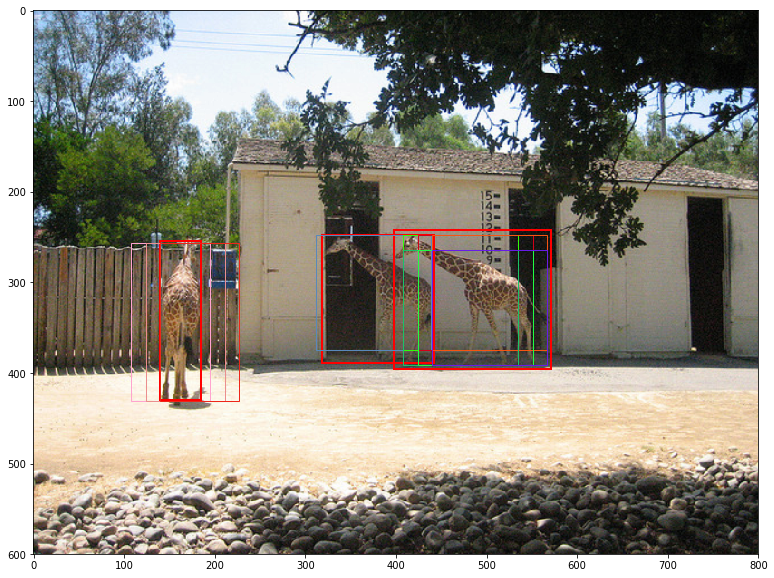

In [42]:
imshow(image_data, gt_boxes, inside_anchors[gt_argmax_overlaps[0]], random=True)

In [43]:
labels[0, gt_argmax_overlaps[0]] = 1
# fg label: above threshold IOU
labels[0, max_overlaps >= 0.7] = 1
labels[0, max_overlaps <= 0.3] = 0

In [45]:
itemindex = np.where(labels==1)
print itemindex

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), array([3105, 3113, 3150, 3157, 3164, 3353, 3361, 3398, 3405, 3412, 3512,
       3517, 3523]))


- Good anchors

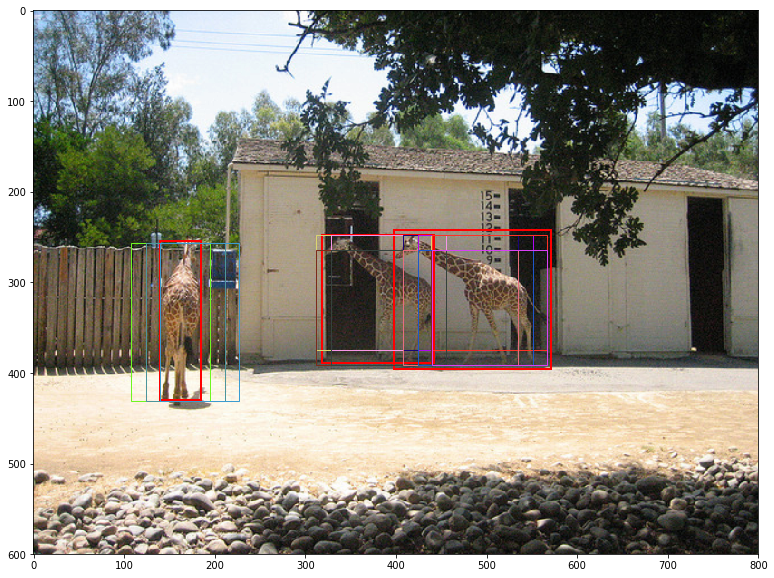

In [46]:
imshow(image_data, gt_boxes, inside_anchors[itemindex[1]], random=True)

- ignore anchors

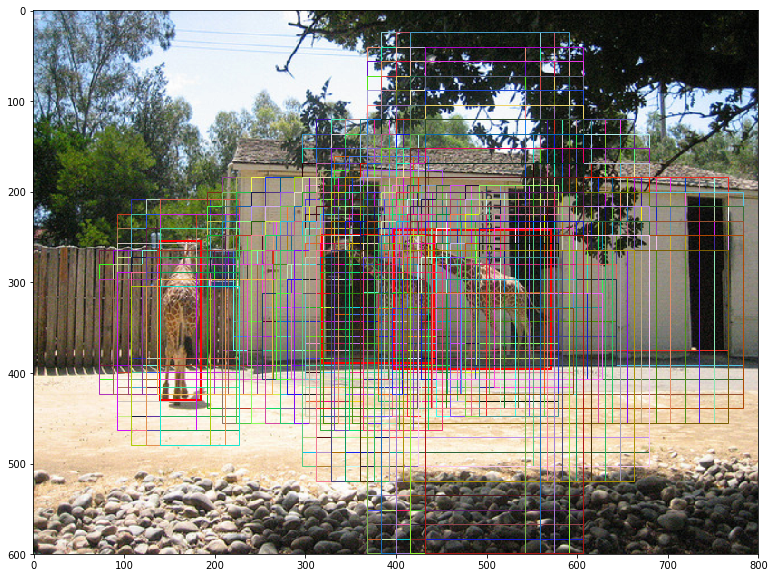

In [47]:
itemindex = np.where(labels==-1)
imshow(image_data, gt_boxes, inside_anchors[itemindex[1]], random=True)

#### Bounding Box Regression Coefficients

- For bounding box regression, we adopt the param-eterizations of the 4 coordinates following:
    
    $t_x = (x - x_a) / w_a, \;  t_y = (y - y_a)/h_a$
    
    $t_w = log(w/w_a), \; t_h = log(h/h_a)$
    
    $t_x^* = (x^* - x_a), \; t_y^* = (y^* - y_a) / h_a$
    
    $t_w^* = log(w^* / w_a),\;  t_h^* = log(h^* / h_a)$
    
    
- Với $x$, $y$, $w$, $h$ tương ứng với tọa độ x, y của tâm hộp, chiều rộng , chiều cao

- $x$ , $x_a$, $x^*$ tương ứng với giá trị của predicted box, anchors, và ground truth boxes

- có thể xem như đây là bounding-box  regression của một anchor box đến một ground-truth box gần nhất 


In [35]:
argmax_overlaps
bbox_targets = bbox_transform(inside_anchors.astype(np.float), gt_boxes[argmax_overlaps, :]).astype(np.float32, copy=False)